# **Fashion Search AI Project Overview**

#### **Objective:** Create a generative search system capable of searching a product descriptions to find and recommend appropriate choices against a user query. Utilize the Myntra dataset available on Kaggle to build such a system.

## **Project Scope:**

The project should implement all three layers effectively. It will be key to try out various strategies and experiments in various layers in order to build an effective search system.



### **The Embedding Layer:**

The CSV document needs to be effectively processed, cleaned, and prepared for embedding.



### **The Search Layer:**

First need to design at least 3 queries against which you will test your system. Next, you need to embed the queries and search your vector database against each of these queries. Implementing a cache mechanism is also mandatory.

Finally, you need to implement the re-ranking block, and for this you can choose from a range of cross-encoding models on HuggingFace.

### **The Generation Layer:**

In the generation layer, the final prompt that you design is the major component.

By effectively addressing each layer and conducting systematic experiments, the aim is to build a highly functional and efficient fashion search system tailored to meet user needs.

## **1. Install and Import the Required Libraries**

In [2]:
# Install all the required libraries

!pip install pdfplumber tiktoken openai chromaDB sentence-transformers requests tqdm memcache -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.2/48.2 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.2/60.2 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 60.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.3/19.3 MB 77.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.2/284.2 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 26.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 89.4 MB/s eta 0:00

In [3]:
pip install openai==0.28.1


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.0/77.0 kB 3.4 MB/s eta 0:00:00
  Attempting uninstall: openai
    Found existing installation: openai 1.81.0
    Uninstalling openai-1.81.0:
      Successfully uninstalled openai-1.81.0


In [4]:

# Importing necessary libraries
import tiktoken  # Assuming this is a custom library for tokenization
import openai  # OpenAI library for accessing GPT models
import chromadb  # ChromaDB library for database operations
from pathlib import Path  # For handling file paths
import pandas as pd  # Pandas for data manipulation
from operator import itemgetter  # For sorting dictionaries
import json  # For working with JSON data
from sklearn.feature_extraction.text import TfidfVectorizer  # TF-IDF vectorizer
from sklearn.metrics.pairwise import cosine_similarity  # Cosine similarity calculation
from nltk.corpus import stopwords  # Stopwords for text processing
from nltk.tokenize import word_tokenize  # Tokenization
import string  # String manipulation functions
from PIL import Image  # Image processing library
import requests  # For making HTTP requests
from io import BytesIO  # For handling binary data
import matplotlib.pyplot as plt  # Matplotlib for visualization
from matplotlib import table  # Table visualization in Matplotlib
import os  # Operating system utilities
import matplotlib.image as mpimg

# Import the CrossEncoder library from sentence_transformers
from sentence_transformers import CrossEncoder, util, SentenceTransformer
# Importing required functions and classes from ChromaDB
from chromadb.utils.embedding_functions import OpenAIEmbeddingFunction

In [5]:
import hashlib

## **2. Dataset**

In [6]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"supriyauppala","key":"122a831ca4ffacbab666e01ba9183754"}'}

In [7]:
import os
import zipfile

# Create a directory for Kaggle and move the kaggle.json file there
os.makedirs('/root/.kaggle', exist_ok=True)
os.rename('kaggle.json', '/root/.kaggle/kaggle.json')

# Set permissions for the kaggle.json file
os.chmod('/root/.kaggle/kaggle.json', 600)

# Install Kaggle API
!pip install -q kaggle

# Download the dataset
!kaggle datasets download -d djagatiya/myntra-fashion-product-dataset

Dataset URL: https://www.kaggle.com/datasets/djagatiya/myntra-fashion-product-dataset
License(s): CC0-1.0
100% 2.84G/2.84G [00:13<00:00, 257MB/s]
100% 2.84G/2.84G [00:13<00:00, 220MB/s]


In [8]:
# Create a directory to extract the dataset
os.makedirs('myntra_dataset', exist_ok=True)

# Unzip the dataset
with zipfile.ZipFile('myntra-fashion-product-dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('myntra_dataset')

In [9]:
# Verify extraction
import os

# List files in the extracted dataset directory
for root, dirs, files in os.walk('myntra_dataset'):
    for file in files:
        print(os.path.join(root, file))

myntra_dataset/Fashion Dataset v2.csv
myntra_dataset/images/15393718.jpg
myntra_dataset/images/15413660.jpg
myntra_dataset/images/14288092.jpg
myntra_dataset/images/13534888.jpg
myntra_dataset/images/16043128.jpg
myntra_dataset/images/16154310.jpg
myntra_dataset/images/16124654.jpg
myntra_dataset/images/18336256.jpg
myntra_dataset/images/17197464.jpg
myntra_dataset/images/16709022.jpg
myntra_dataset/images/12252826.jpg
myntra_dataset/images/16442258.jpg
myntra_dataset/images/19028556.jpg
myntra_dataset/images/17445068.jpg
myntra_dataset/images/17487012.jpg
myntra_dataset/images/14447530.jpg
myntra_dataset/images/5803888.jpg
myntra_dataset/images/16015064.jpg
myntra_dataset/images/11884096.jpg
myntra_dataset/images/10466122.jpg
myntra_dataset/images/9338271.jpg
myntra_dataset/images/14572346.jpg
myntra_dataset/images/17555638.jpg
myntra_dataset/images/12133336.jpg
myntra_dataset/images/19104006.jpg
myntra_dataset/images/15578754.jpg
myntra_dataset/images/9552603.jpg
myntra_dataset/image

## **3. Read, Process the csv Files**

In [10]:
# Define the file path to the Fashion Dataset CSV file
file_path = '/content/myntra_dataset/Fashion Dataset v2.csv'

# Read the Fashion Dataset CSV file into a Pandas DataFrame
fashion_data = pd.read_csv(file_path)

# Display the first few rows of the DataFrame to verify the data has been loaded correctly
fashion_data.head()

,p_id,name,products,price,colour,brand,img,ratingCount,avg_rating,description,p_attributes
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,http://assets.myntassets.com/assets/images/170...,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,http://assets.myntassets.com/assets/images/165...,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,http://assets.myntassets.com/assets/images/163...,1752.0,4.161530,Navy blue embroidered Kurta with Trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,http://assets.myntassets.com/assets/images/147...,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,http://assets.myntassets.com/assets/images/110...,21274.0,3.978377,"Black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size..."


### **3.1 viewing image**

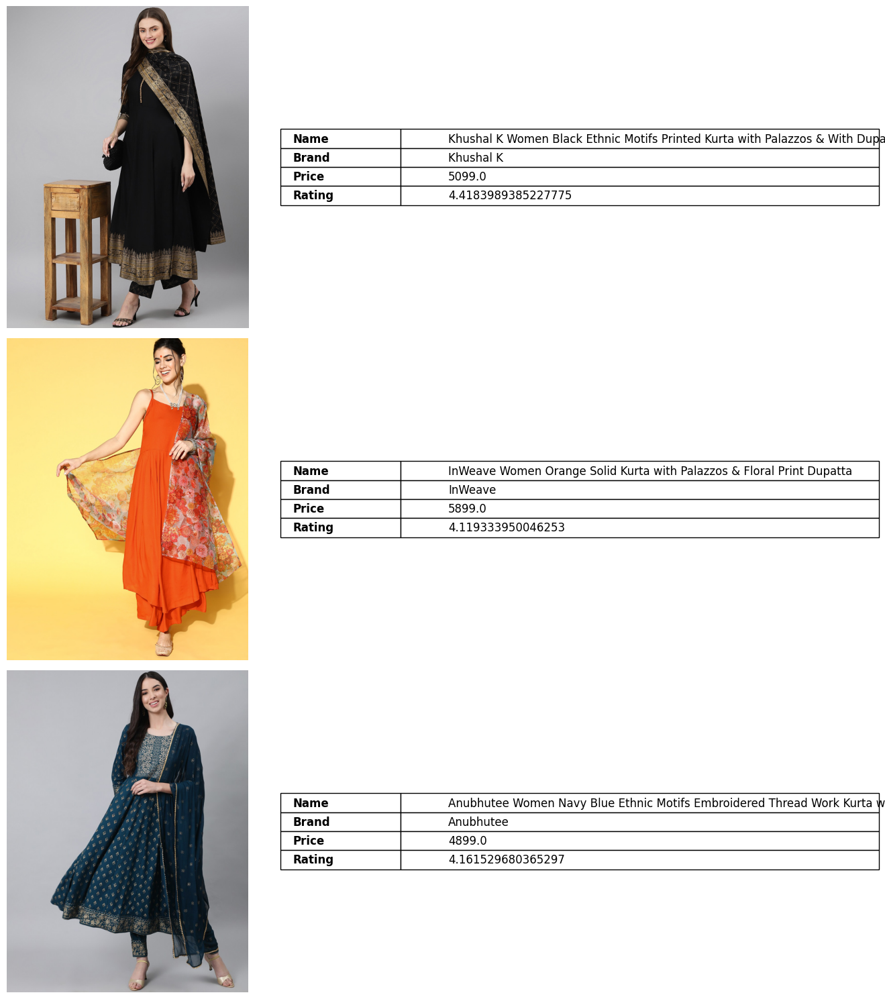

In [11]:
# Define the path to the images folder
images_folder_path = '/content/myntra_dataset/images'

# Define a function to display images with mini tables
def display_images_with_info(df, images_folder_path, num_images=3):
    """
    Display images with accompanying mini tables containing information from the DataFrame.

    Args:
    - df: DataFrame containing image information
    - images_folder_path: Path to the folder containing the images
    - num_images: Number of images to display

    Returns:
    None
    """
    # Create subplots to display images and mini tables
    fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 5))

    # Iterate over each row in the DataFrame and display the image with mini table
    for i, (idx, row) in enumerate(df.head(num_images).iterrows()):
        # Construct the path to the image file
        image_path = os.path.join(images_folder_path, str(row['p_id']) + '.jpg')

        # Check if the image file exists
        if os.path.exists(image_path):
            # Open the image file
            img = Image.open(image_path)

            # Display the image
            axes[i, 0].imshow(img)
            axes[i, 0].axis('off')

            # Create a mini table with information from the DataFrame
            table_data = [['Name', row['name']],
                          ['Brand', row['brand']],
                          ['Price', row['price']],
                          ['Rating', row['avg_rating']]]

            axes[i, 1].axis('off')
            mini_table = axes[i, 1].table(cellText=table_data, loc='center', cellLoc='left', colWidths=[0.2, 0.8])

            # Format the mini table
            for cell in mini_table.get_celld().values():
                if cell.get_text().get_text() in ['Name', 'Brand', 'Price', 'Rating']:
                    cell.get_text().set_fontweight('bold')
                cell.get_text().set_fontsize(12)

            # Set font size explicitly for all cells
            mini_table.auto_set_font_size(False)
            mini_table.set_fontsize(12)
            mini_table.scale(1.2, 1.2)  # Adjust the scaling factor as needed
        else:
            print(f"Image not found for p_id: {row['p_id']}")

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

# Display images with mini tables for the first 3 images
display_images_with_info(fashion_data, images_folder_path, num_images=3)

In [12]:
# Print the columns of the fashion_data DataFrame
print(fashion_data.columns)

Index(['p_id', 'name', 'products', 'price', 'colour', 'brand', 'img',
       'ratingCount', 'avg_rating', 'description', 'p_attributes'],
      dtype='object')


In [13]:

# Print the information about the fashion_data DataFrame
print(fashion_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14214 entries, 0 to 14213
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   p_id          14214 non-null  int64  
 1   name          14214 non-null  object 
 2   products      14214 non-null  object 
 3   price         14214 non-null  float64
 4   colour        14214 non-null  object 
 5   brand         14214 non-null  object 
 6   img           14214 non-null  object 
 7   ratingCount   6530 non-null   float64
 8   avg_rating    6530 non-null   float64
 9   description   14214 non-null  object 
 10  p_attributes  14214 non-null  object 
dtypes: float64(3), int64(1), object(7)
memory usage: 1.2+ MB
None


In [14]:
# Importing the necessary library for mounting Google Drive
from google.colab import drive

# Mounting Google Drive to the Colab environment
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [15]:
import os
os.environ['PYTHONIOENCODING'] = 'utf-8'

In [16]:
# 📌 Optional: Set global paths
DATA_PATH = "/content/myntra_dataset/Fashion Dataset v2.csv"
CHROMA_PATH = "/content/drive/MyDrive/Colab Notebooks/GENAI/FashionSearchAI_SupriyaUppala/ChromaDB_Data"

In [17]:
# 🧹 3. Load and Preprocess Data
def load_and_clean_data(filepath):
    df = pd.read_csv(filepath, encoding='utf-8')
    print("Available columns:", df.columns.tolist())  # Optional: to verify again
    df = df.dropna(subset=['name'])  # Using 'name' instead of 'productDisplayName'
    df = df.drop_duplicates()
    df['text_chunk'] = df.apply(
        lambda x: f"{x['name']} - {x.get('products', '')} - {x.get('p_attributes', '')} - {x.get('description', '')}",
        axis=1
    )
    return df


In [80]:
fashion_data = load_and_clean_data(DATA_PATH)
display(fashion_data.head())

Available columns: ['p_id', 'name', 'products', 'price', 'colour', 'brand', 'img', 'ratingCount', 'avg_rating', 'description', 'p_attributes']


,p_id,name,products,price,colour,brand,img,ratingCount,avg_rating,description,p_attributes,text_chunk
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,http://assets.myntassets.com/assets/images/170...,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...",Khushal K Women Black Ethnic Motifs Printed Ku...
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,http://assets.myntassets.com/assets/images/165...,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...",InWeave Women Orange Solid Kurta with Palazzos...
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,http://assets.myntassets.com/assets/images/163...,1752.0,4.161530,Navy blue embroidered Kurta with Trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ...",Anubhutee Women Navy Blue Ethnic Motifs Embroi...
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,http://assets.myntassets.com/assets/images/147...,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ...",Nayo Women Red Floral Printed Kurta With Trous...
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,http://assets.myntassets.com/assets/images/110...,21274.0,3.978377,"Black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size...",AHIKA Women Black & Green Printed Straight Kur...


## **4. Dataset Chunking Explanation**

In this analysis, we have chosen not to perform dataset chunking. The reason for this decision is that our dataset is already structured with each data point residing in its respective rows and columns. Chunking, typically done to break down large datasets into smaller, more manageable chunks, would be necessary if our dataset exceeded a certain size or if we needed to process it in smaller portions based on specific parameters such as time, categories, or other criteria.

However, due to time constraints and the manageable size of our dataset, we have opted to skip the chunking process for the time being. While chunking could potentially offer benefits in terms of handling large volumes of data more efficiently, it is not currently deemed necessary for our analysis given the scope and scale of our dataset.

Should our dataset expand or our analysis requirements evolve, we may revisit the idea of implementing chunking as a means to optimize our data processing pipeline. For now, we will proceed with the dataset in its entirety, leveraging its existing structure to derive insights and perform analyses.

## **5.Generate and Store Embeddings using OpenAI and ChromaDB**

In this section, we will embed the pages in the dataframe through OpenAI's text-embedding-ada-002 model, and store them in a ChromaDB collection.

### **Embedding Layer**

In [19]:
# 🧠 3. Embedding Model Setup
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [20]:
# ChromaDB Initialization
chroma_client = chromadb.PersistentClient(path=CHROMA_PATH)
collection = chroma_client.get_or_create_collection(name="fashion_items")

In [21]:
# Embed and Add to DB
def embed_and_store_batched(df, batch_size=64):
    for start in range(0, len(df), batch_size):
        end = start + batch_size
        batch = df.iloc[start:end]
        texts = batch['text_chunk'].tolist()
        pids = batch['p_id'].astype(str).tolist()
        embeddings = embedding_model.encode(texts, batch_size=batch_size, show_progress_bar=True).tolist()
        metadatas = [
            {
                "brand": row.get("brand", ""),
                "category": row.get("products", ""),
                "color": row.get("colour", "")
            } for _, row in batch.iterrows()
        ]
        try:
            collection.add(documents=texts, ids=pids, embeddings=embeddings, metadatas=metadatas)
        except Exception as e:
            print(f"❌ Error adding batch {start}-{end}: {e}")




In [22]:
sample_data = fashion_data.sample(100)  # try 100 rows
embed_and_store_batched(sample_data)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

In [23]:
embed_and_store_batched(fashion_data, batch_size=500)


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

### **6. Semantic Search with Cache**

In this section, we will perform a semantic search of a query in the collections embeddings to get several top semantically similar results.



In [24]:
# 🔍 4. Search Layer (Query, Cache, Re-Ranking)
search_cache = {}
cross_encoder = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2')


config.json:   0%|          | 0.00/794 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.33k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/132 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.66k [00:00<?, ?B/s]

In [25]:
def get_query_hash(query):
    return hashlib.sha256(query.encode('utf-8')).hexdigest()


#### **6.1 Search Layer**

In [26]:
def search_with_cache(query, top_k=10):
    query_hash = get_query_hash(query)
    if query_hash in search_cache:
        return search_cache[query_hash]
    q_embedding = embedding_model.encode(query).tolist()
    results = collection.query(query_embeddings=[q_embedding], n_results=top_k)
    search_cache[query_hash] = results
    return results

### **7.Re-Ranking with a Cross Encoder**

Re-ranking the results obtained from your semantic search can sometime significantly improve the relevance of the retrieved results. This is often done by passing the query paired with each of the retrieved responses into a cross-encoder to score the relevance of the response w.r.t. the query.



In [27]:
def rerank_results(query, results):
    texts = results['documents'][0]
    pairs = [(query, doc) for doc in texts]
    scores = cross_encoder.predict(pairs)
    reranked = sorted(zip(texts, results['ids'][0], scores), key=lambda x: x[2], reverse=True)
    return reranked

In [28]:
# 🧪 Example Query
from IPython.display import Image, display

images_folder_path = '/content/myntra_dataset/images'

def run_query(query):
    print(f"\n🔍 Query: {query}")
    initial_results = search_with_cache(query)
    reranked = rerank_results(query, initial_results)

    for rank, (doc, pid, score) in enumerate(reranked[:5], 1):
        print(f"{rank}. {doc} (Score: {score:.4f})")
        image_path = os.path.join(images_folder_path, f"{pid}.jpg")

        # Show image if it exists
        if os.path.exists(image_path):
            display(Image(filename=image_path, width=150))
        else:
            print(f"❌ Image not found: {image_path}")


🔍 Query: I want a summer dress for beach under 1000
1. bebe Paradise Coral Holiday Printed Basic Jumpsuit - Jumpsuit - {'Body or Garment Size': 'Garment Measurements in', 'Closure': 'Concealed Zip', 'Collection Name': "<b>Holiday</b><br>\nAs summer getaways resume, vacation ready pieces that boost positivity cater to consumers' increasing desire for joyful expression and optimistic dressing.", 'Fabric': 'Polyester', 'Main Trend': 'NA', 'Neck': 'Shoulder Straps', 'Number of Pockets': '2', 'Occasion': 'Casual', 'Pattern': 'Printed', 'Sleeve Length': 'Sleeveless', 'Surface Styling': 'Waist Tie-Ups', 'Sustainable': 'Regular', 'Type': 'Basic Jumpsuit', 'Wash Care': 'Machine Wash'} - Add a punch of vibrant hues to your spring and summer collection and welcome the warm weather in the most magical way<ul><li>Coral printed jumpsuit</li><li>Shoulder straps</li><li>Concealed zip closure</li></ul><br>Size worn by the model: S<br>Chest: 32"<br>Waist: 25"<br>Hips: 35"<br>Height: 5'7"<br>100% Polyes

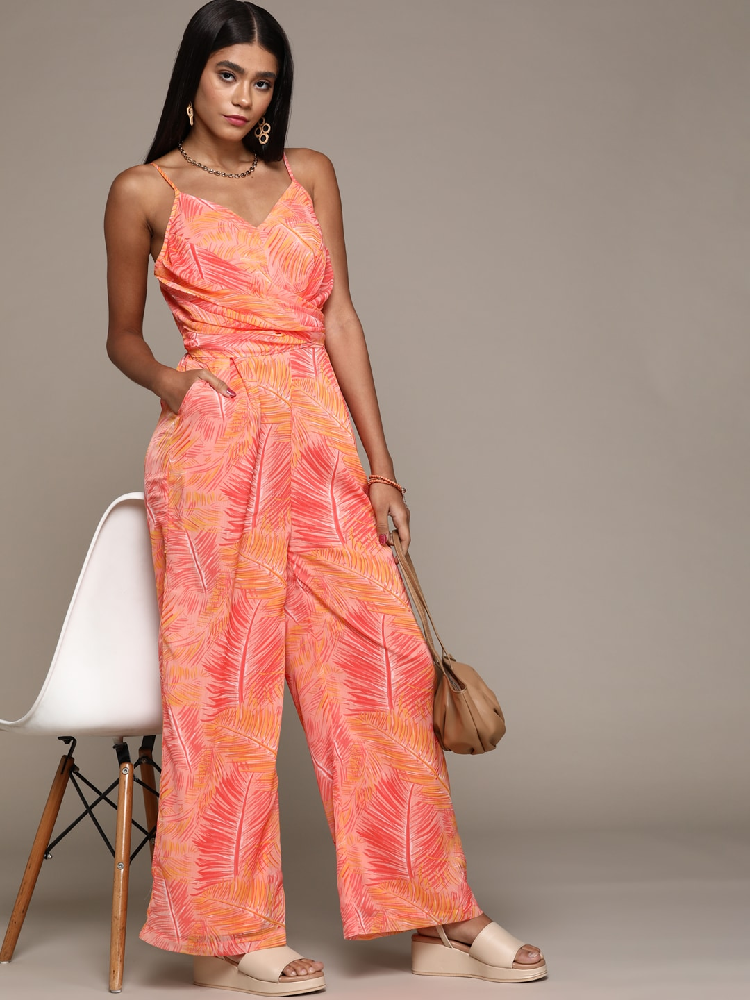

2. DressBerry Women Olive Green High-Rise Trousers - Trousers - {'Add-Ons': 'NA', 'Body Shape ID': '424', 'Body or Garment Size': 'To-Fit Denotes Body Measurements in', 'Brand Fit Name': 'NA', 'Care for me': 'Follow the garment wash care label<br>\r\nCan be tumble dried in a cool setting if machine washed<br>\r\nPrevent static build-up by drying while damp<br>\r\nUse low heat to iron', 'Character': 'NA', 'Closure': 'Slip-On', 'Contact Brand or Retailer for pre-sales product queries': 'care@divawalk.com', 'Fabric': 'Polyester', 'Fabric 2': 'NA', 'Features': 'Plain', 'Fit': 'Regular Fit', 'Fly Type': 'Zip', 'Length': 'Cropped', 'Main Trend': 'New Basics', 'Multipack Set': 'NA', 'Number of Pockets': 'NA', 'Occasion': 'Casual', 'Pattern': 'Solid', 'Print or Pattern Type': 'Solid', 'Sustainable': 'Sustainable', 'Type': 'Parallel Trousers', 'Type of Pleat': 'Flat-Front', 'Waist Rise': 'High-Rise', 'Wash Care': 'Machine Wash', 'Weave Type': 'Knitted'} - <ul> <li> Olive green knitted parallel 

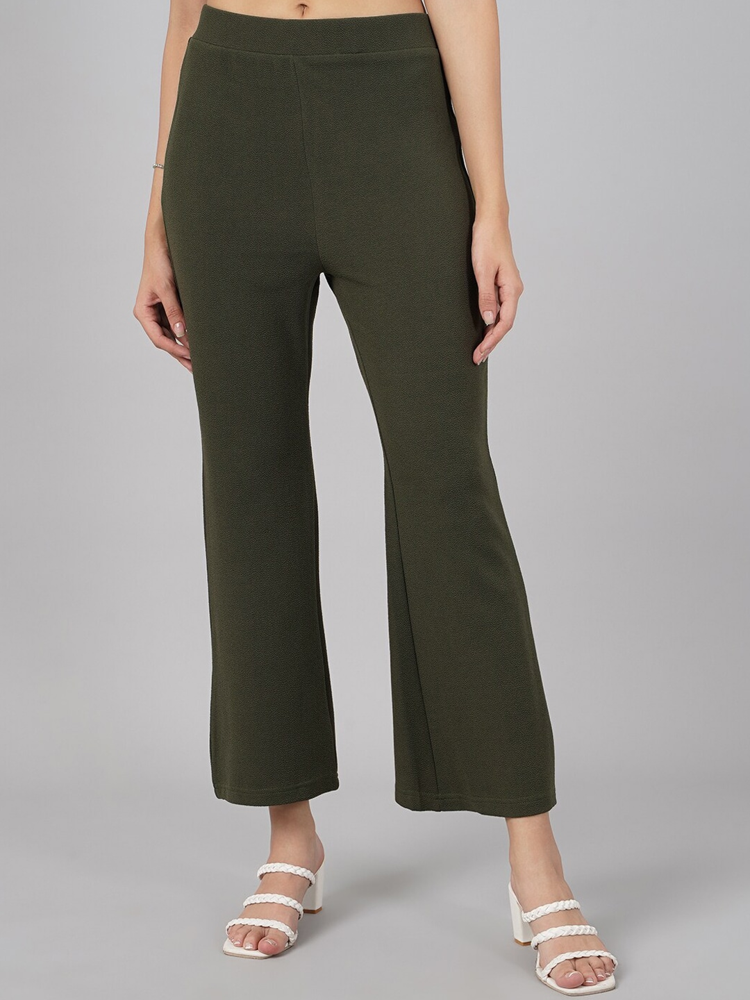

3. 20Dresses Women Olive Green Chinos Trousers - Chinos, Trousers - {'Add-Ons': 'NA', 'Better Cotton Initiative': 'Regular', 'Body Shape ID': '443,333,424', 'Body or Garment Size': 'To-Fit Denotes Body Measurements in', 'Brand Fit Name': 'NA', 'Care for me': 'Follow the fabric care label. Warm machine wash is recommended.\r\nCan be tumble dried in a cool setting.\r\nPrevent static build-up by drying while damp. \r\nUse low heat to iron.', 'Character': 'NA', 'Closure': 'Button', 'Fabric': 'Polyester', 'Fabric 2': 'Polyester', 'Features': 'Plain', 'Fit': 'Regular Fit', 'Fly Type': 'Zip', 'Length': 'Regular', 'Main Trend': 'New Basics', 'Multipack Set': 'NA', 'Number of Pockets': '4', 'Occasion': 'Party', 'Pattern': 'Solid', 'Print or Pattern Type': 'Solid', 'Sustainable': 'Regular', 'Type': 'Chinos', 'Type of Pleat': 'Flat-Front', 'Waist Rise': 'Mid-Rise', 'Wash Care': 'Hand Wash', 'Weave Type': 'Woven'} - <ul> <li> Olive green woven chinos </li> <li> Regular fit </li> <li> Mid-rise </li

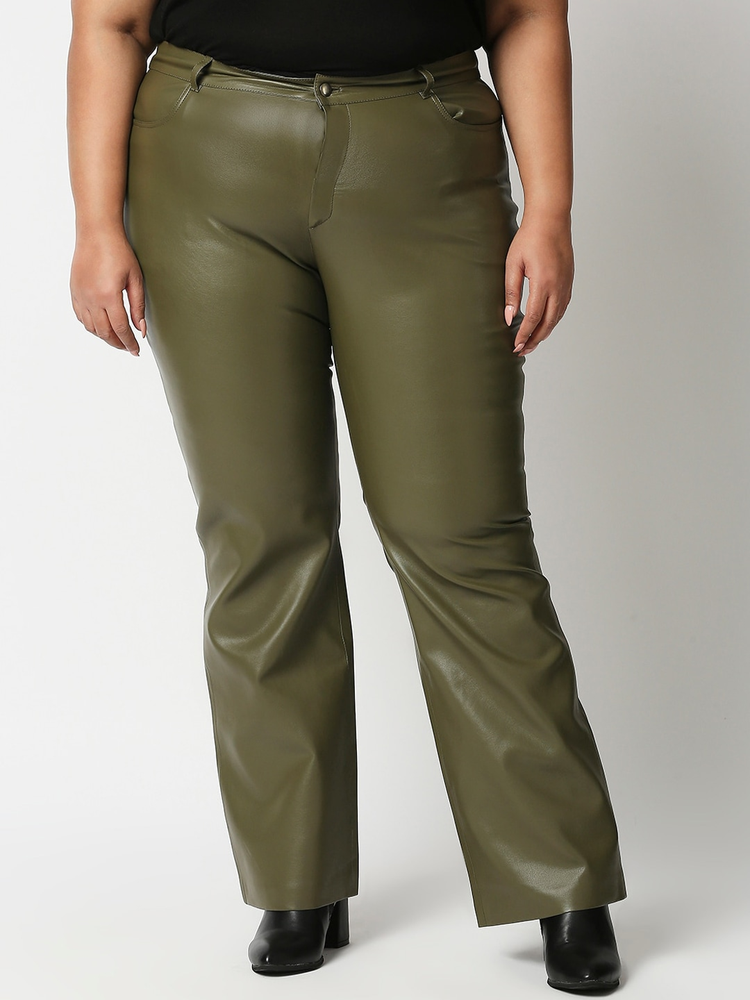

4. kriatma Women Peach Solid Cotton Mini Skirts - Skirts - {'Add-Ons': 'NA', 'Body Shape ID': '333,424', 'Body or Garment Size': 'To-Fit Denotes Body Measurements in', 'Character': 'NA', 'Closure': 'Button', 'Contact Brand or Retailer for pre-sales product queries': 'accounts@kriatma.in', 'Fabric': 'Pure Cotton', 'Fabric Type': 'Corduroy', 'Hemline': 'Straight', 'Knit or Woven': 'Woven', 'Length': 'Above Knee', 'Lining': 'NA', 'Main Trend': 'New Basics', 'Number of Pockets': 'NA', 'Occasion': 'Casual', 'Pattern': 'Solid', 'Print or Pattern Type': 'Solid', 'Slit Detail': 'Front Slit', 'Sub Trend': 'New Basics', 'Surface Styling': 'Sheen', 'Sustainable': 'Sustainable', 'Transparency': 'Opaque', 'Type': 'A-Line', 'Wash Care': 'Machine Wash', 'Wedding': 'NA'} - <p>Peach solid corduroy A-line mini skirt, has a waistband, full button placket at front With Slit and straight hem</p><p>The model (height 5'8") is wearing size 28</p><p>Material: Cotton Corduroy<br>Machine Wash</p> (Score: -11.265

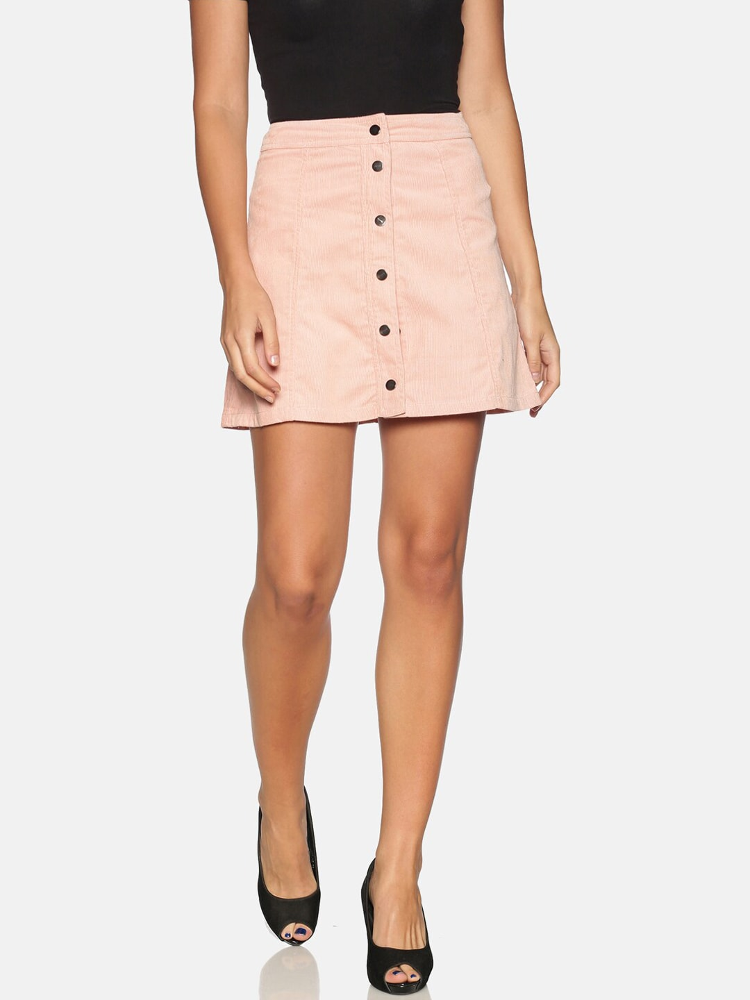

5. H&M Women Green Solid Mini Skirts - Mini Skirts - {'Add-Ons': 'NA', 'Body Shape ID': '424', 'Body or Garment Size': 'To-Fit Denotes Body Measurements in', 'Character': 'NA', 'Closure': 'Slip-On', 'Fabric': 'Cotton Blend', 'Fabric Type': 'NA', 'Hemline': 'Straight', 'Knit or Woven': 'Knitted', 'Length': 'Mini', 'Lining': 'NA', 'Main Trend': 'New Basics', 'Number of Pockets': 'NA', 'Occasion': 'Casual', 'Pattern': 'Solid', 'Print or Pattern Type': 'Self Design', 'Slit Detail': 'NA', 'Sub Trend': 'New Basics', 'Surface Styling': 'NA', 'Sustainable': 'Regular', 'Transparency': 'Semi Sheer', 'Type': 'Pencil', 'Wash Care': 'Machine Wash', 'Wedding': 'NA'} - <p>Short, fitted skirt in soft cotton jersey with a wide, elasticated waist. Unlined.</p>95% Cotton, 5% Elastane<br>Machine Wash (Score: -11.3220)


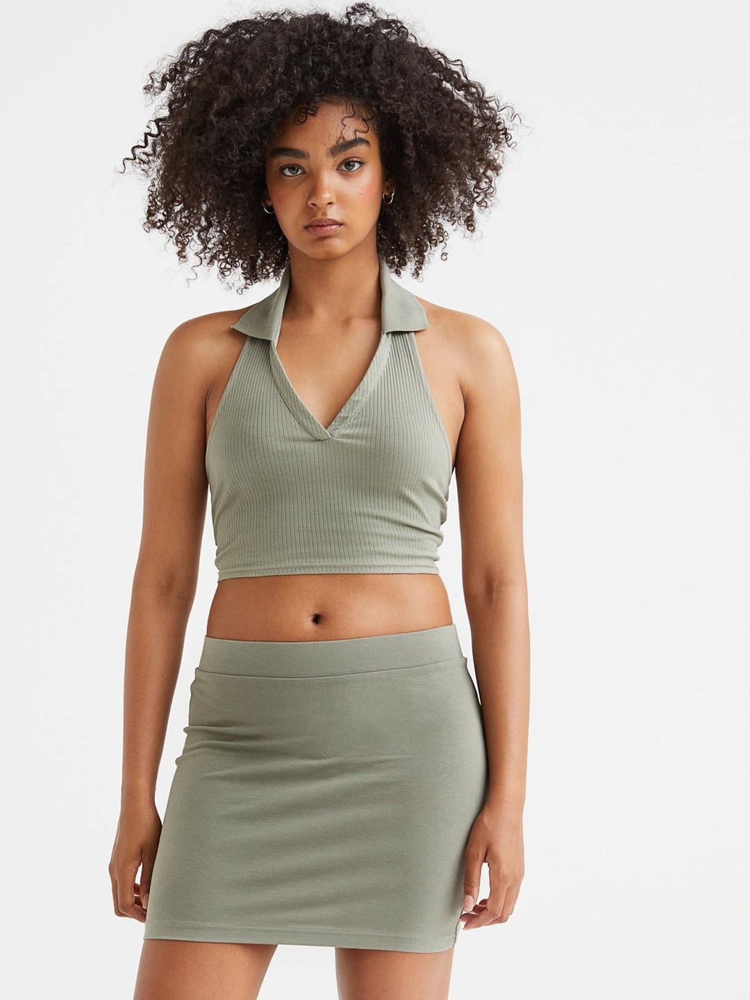

In [30]:
run_query("I want a summer dress for beach under 1000")

## **8. Retrieval Augmented Generation**

In [36]:


# Define the file path to retrieve the API key
filepath = "/content/drive/MyDrive/Colab Notebooks/GENAI/"

# Read the API key from the text file and strip any leading or trailing whitespace
with open(filepath + "GPT_API_Key_2.txt", "r") as f:
    api_key = f.read().strip()

# Set the API key for OpenAI
# openai.api_key = api_key
api_key = api_key.replace('\ufeff', '').strip()
api_key = api_key.encode("ascii", "ignore").decode("ascii")
openai.api_key = api_key


In [39]:
# 🤖 5. Generation Layer with Prompting

import json
import re
from IPython.display import display, Markdown

def clean_unicode(text):
    if isinstance(text, str):
        # Remove BOM and keep only ASCII
        return text.replace('\ufeff', '').encode('ascii', 'ignore').decode('ascii')
    return str(text)

def generate_response(query, top_docs):
    clean_query = clean_unicode(query)
    clean_docs = [clean_unicode(doc) for doc in top_docs]

    # Safe ASCII-only prompt using ensure_ascii=True
    prompt_json = json.dumps(clean_docs, indent=2, ensure_ascii=True)

    prompt = f"""
You are a fashion assistant. Based on the query: \"{clean_query}\", recommend the most suitable products from the list below:

{prompt_json}

Give a friendly, clear recommendation of 3-5 items including product name and why it's suitable.
"""

    prompt = clean_unicode(prompt)  # Final clean

    response = openai.ChatCompletion.create(
        model="gpt-3.5-turbo",
        messages=[
            {"role": "system", "content": "You are a helpful fashion shopping assistant."},
            {"role": "user", "content": prompt}
        ]
    )
    return response['choices'][0]['message']['content']





In [74]:
from PIL import Image as PILImage, UnidentifiedImageError  # ✅ Rename this to avoid conflict
import matplotlib.pyplot as plt
import os

# display images

def display_images_grid_colab(pids, image_folder, width=200):
    valid_paths = []
    valid_ids = []

    # ✅ Pre-validate all image paths before display
    for pid in pids:
        for ext in ['jpg', 'jpeg', 'png']:
            path = os.path.join(image_folder, f"{pid}.{ext}")
            if os.path.exists(path):
                try:
                    PILImage.open(path)  # 🔍 Try to open the image
                    valid_paths.append(path)
                    valid_ids.append(pid)
                    break
                except UnidentifiedImageError:
                    print(f"❌ Corrupted or unsupported image: {path}")

    num_images = len(valid_paths)
    if num_images == 0:
        print("❌ No valid images found to display.")
        return

    fig, axes = plt.subplots(1, num_images, figsize=(num_images * 4, 5))

    # If only 1 image, axes is not a list
    if num_images == 1:
        axes = [axes]

    for ax, path, pid in zip(axes, valid_paths, valid_ids):
        img = PILImage.open(path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"ID: {pid}", fontsize=12)

    plt.tight_layout()
    plt.show()


In [78]:
# Display search results in the form of table

import pandas as pd
import ast
from IPython.display import display

def display_reranked_results_as_table(ranked_pids, top_docs, reranked, fashion_data):
    table_rows = []
    for i, pid in enumerate(ranked_pids):
        row_data = fashion_data[fashion_data['p_id'] == int(pid)]
        if not row_data.empty:
            name = row_data.iloc[0]['name']
            p_type = row_data.iloc[0]['products']
            description = row_data.iloc[0]['description']
            attributes = row_data.iloc[0]['p_attributes']
            score = reranked[i][2]  # score from reranked tuple

            table_rows.append({
                'Product Name': name,
                'Product Type': p_type,
                'Description': description,
                'Score': round(score, 4),
                'Attributes': attributes
            })

    # Display as a DataFrame
    df = pd.DataFrame(table_rows)
    display(df)


#### **Use fuzzywuzzy to find the closest match in fashion_data['name'].**

In [67]:
!pip install fuzzywuzzy[speedup]


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.7/161.7 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 39.9 MB/s eta 0:00:00


In [68]:
from fuzzywuzzy import fuzz

def get_best_matching_pids(response_text, fashion_df, threshold=85):
    matched_pids = []
    for name in fashion_df['name'].unique():
        score = fuzz.partial_ratio(name.lower(), response_text.lower())
        if score >= threshold:
            pid_row = fashion_df[fashion_df['name'] == name]
            if not pid_row.empty:
                pid = str(pid_row.iloc[0]['p_id'])
                matched_pids.append(pid)
    return list(set(matched_pids))  # remove duplicates



🔍 **Query:** Looking for a floral kurta set under ₹1500 for festive wear


🔍 Search Layer:


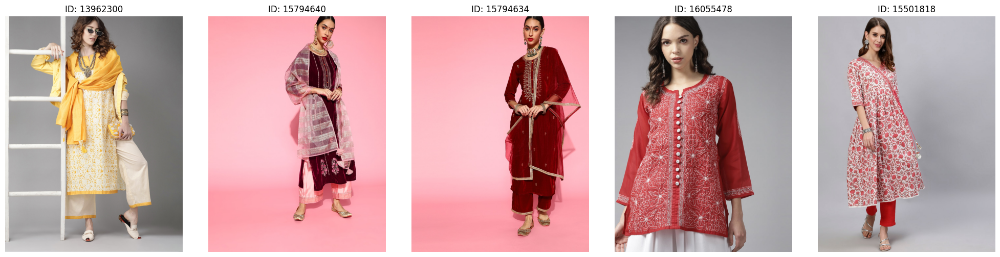

,Product Name,Product Type,Description,Score,Attributes
0,Indo Era Classy Off White And Yellow Printed K...,Kurta Set,Add an elegant touch to your look instantly wi...,1.5607,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
1,Indo Era Woven Design Velvet Kurta Set,Kurta Set,"An absolute go-to for special occasions, this ...",0.6167,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
2,Indo Era Embroidered Velvet Kurta Set,Kurta Set,Achieve the perfect ethnic look with this eleg...,-0.6273,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
3,ADA Red & White Floral Embroidered Chikankari ...,Kurti,<ul><li>Red and white straight kurti</li><li>F...,-1.2105,{'Body or Garment Size': 'Garment Measurements...
4,Jaipur Kurti Women White Floral Printed Angrak...,Kurta,<ul> <li> Colour: white </li> <li> Floral prin...,-1.3695,"{'Body Shape ID': '443,333,324,424', 'Body or ..."



-------------------------------------------------------------------------------------------------------

🔍 Generation Layer:


Based on your query for a floral kurta set under 1500 for festive wear, here are your top recommendations:

1. Indo Era Classy Off White And Yellow Printed Kurta Set: This kurta set features a beautiful floral printed kurta in off white and yellow hues, making it perfect for festive wear. It comes with palazzos and a striped dupatta, giving a complete look for under 1500.

2. ADA Red & White Floral Embroidered Chikankari Kurti: This red and white floral embroidered kurti is a great option for festive occasions. The handloom cotton blend fabric and elegant embroidery make it a stylish and sustainable choice for under 1500.

3. Jaipur Kurti Women White Floral Printed Angrakha Kurta: This white floral printed angrakha kurta is another excellent option for festive wear. With its V-neck, three-quarter sleeves, and thread work detail, it offers a unique and fashionable look for under 1500.

These recommendations combine style, comfort, and affordability, making them ideal choices for your festive wardrobe.

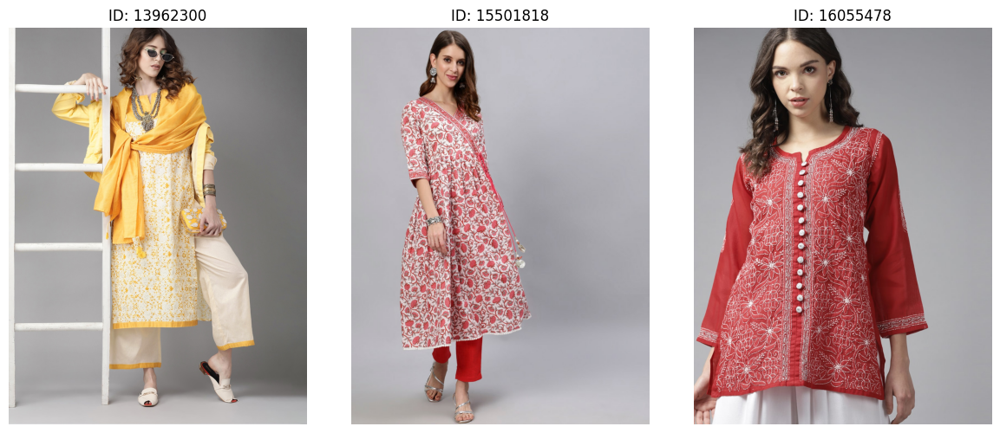



🔍 **Query:** Show me summer dresses for women with cotton fabric


🔍 Search Layer:


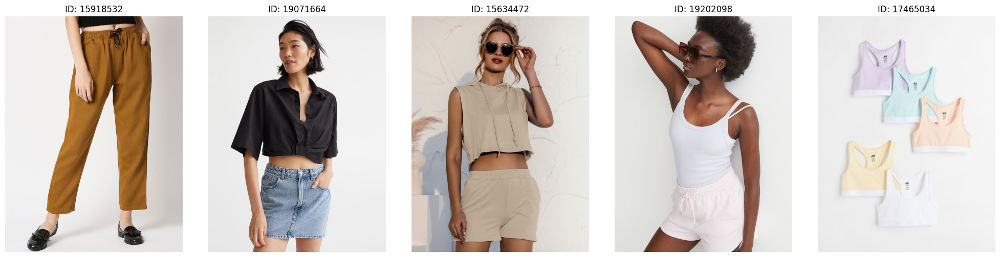

,Product Name,Product Type,Description,Score,Attributes
0,High Star Women Rust Orange Mom Fit Cotton Tro...,Trousers,<ul><li>Rust orange woven trousers</li><li>Mom...,-3.0613,"{'Add-Ons': 'NA', 'Body or Garment Size': 'To-..."
1,H&M Women Blue Denim Skirt,Skirt,"<p>Short, 5-pocket skirt in sturdy cotton deni...",-3.4652,"{'Add-Ons': 'NA', 'Body Shape ID': '443,424', ..."
2,URBANIC Women Beige Solid Cotton Hooded Co-Ord...,Co-Ords Set,<b>Top design</b><ul><li>Beige solid crop top<...,-3.6055,"{'Add-Ons': 'NA', 'Bottom Closure': 'Slip-On',..."
3,H&M Women Blue Cotton Vest Top,Vest Top,<p>Vest top in soft cotton jersey with narrow ...,-3.8682,"{'Body Shape ID': '324,424', 'Body or Garment ..."
4,H&M Girls Pink & Turquoise Blue 5-Pack Cotton ...,Crop Tops,<p>Crop tops in soft cotton jersey with a race...,-4.2611,{'Body or Garment Size': 'Garment Measurements...



-------------------------------------------------------------------------------------------------------

🔍 Generation Layer:


Here are some summer dresses for women with cotton fabric:

1. **H&M Women Blue Denim Skirt**
   - This denim skirt is made of pure cotton, making it breathable and perfect for summer. The straight style and mini length offer a casual and stylish look for warm weather.

2. **URBANIC Women Beige Solid Cotton Hooded Co-Ords Set**
   - This co-ords set is made of pure cotton, ensuring comfort and breathability during summer. The beige solid crop top with a hood and the matching shorts make a trendy and effortless summer outfit.

3. **H&M Women Blue Cotton Vest Top**
   - This vest top is made of soft cotton jersey, which is ideal for hot summer days. The sleeveless design and shoulder straps provide a comfortable and stylish option for casual summer wear.

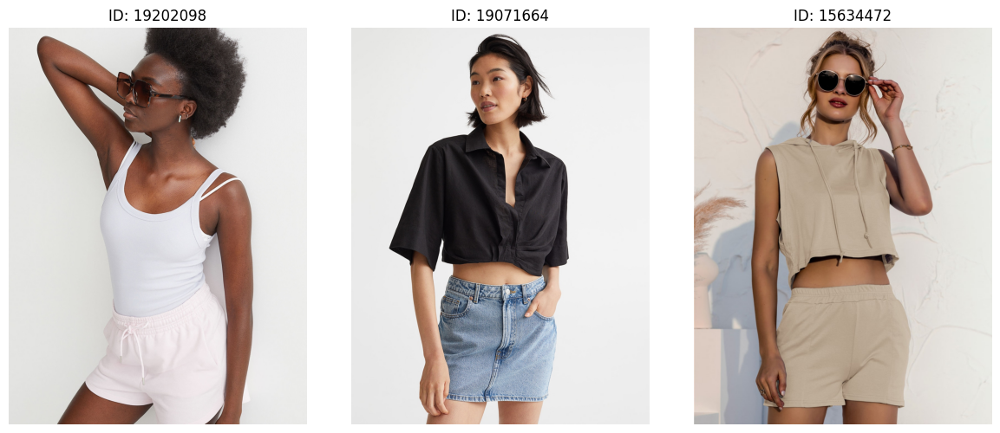



🔍 **Query:** Suggest formal shirts for office meetings


🔍 Search Layer:


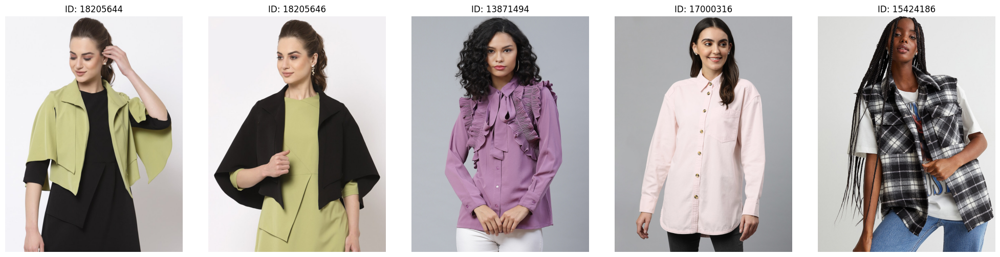

,Product Name,Product Type,Description,Score,Attributes
0,OFFICE & YOU Women Olive Green Shrug,Shrug,"Olive green solid open front regular shrug ,ha...",-9.2650,{'Body or Garment Size': 'Garment Measurements...
1,OFFICE & YOU Women Black Shrug,Shrug,"Black solid open front regular shrug ,has thre...",-9.7093,{'Body or Garment Size': 'Garment Measurements...
2,plusS Purple Ruffle Detail Shirt Style Victori...,"Shirt, Top",Feel confident and look great as you step out ...,-9.7122,"{'Body Shape ID': '324,424', 'Body or Garment ..."
3,Marks & Spencer Pink Shirt Style Top,"Shirt, Top",<ul> <li> Pink regular shirt style top </li> <...,-10.3032,"{'Body Shape ID': '333,324,424', 'Body or Garm..."
4,H&M Women Black Checked Sleeveless Shirts,Shirts,<p>Straight-cut sleeveless shirt in a soft wea...,-10.5309,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,42..."



-------------------------------------------------------------------------------------------------------

🔍 Generation Layer:


Based on your query for formal shirts for office meetings, here are some recommended options:

1. **Marks & Spencer Pink Shirt Style Top**
   - This pink shirt style top is a great option for office meetings due to its classic design with a shirt collar, long cuffed sleeves, and button closure. Made from pure cotton, it offers comfort and a professional look for formal settings.

2. **OFFICE & YOU Women Black Shrug**
   - The black shrug with three-quarter sleeves and a straight hem is a versatile layering piece that can be worn over a camisole or blouse for a polished office look. Its open front style adds a touch of sophistication to your outfit.

3. **plusS Purple Ruffle Detail Shirt Style Victorian Top**
   - While not a traditional shirt, this purple ruffle detail top with tie-up neck and long sleeves offers a unique and stylish twist on office attire. The ruffles add a trendy touch while still maintaining a professional look, perfect for making a statement in meetings.

These options provide a mix of classic and trendy styles suitable for office meetings, ensuring you look both professional and fashionable.

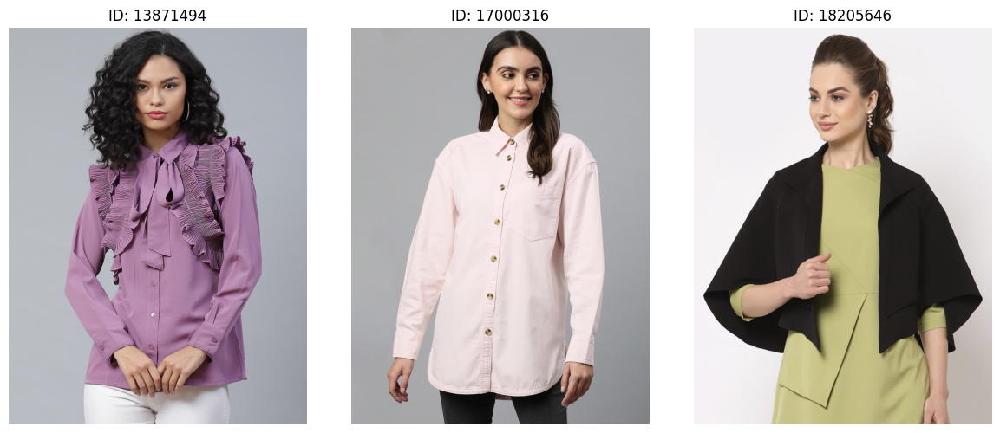



🔍 **Query:** Need winter jackets for women in black or navy blue


🔍 Search Layer:


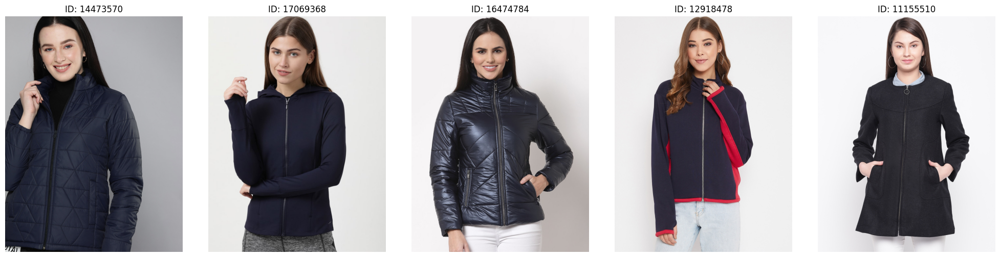

,Product Name,Product Type,Description,Score,Attributes
0,HERE&NOW Women Navy Blue Padded Jacket,Jacket,"Navy blue solid padded jacket, has a stand co...",0.0623,"{'Add-Ons': 'NA', 'Body Shape ID': '443,324,33..."
1,Jockey Women Navy Blue Longline Tailored Jacket,Jacket,Navy blue solid tailored jacket with faux fur...,0.0359,"{'Add-Ons': 'NA', 'Body Shape ID': '424', 'Bod..."
2,Juelle Women Navy Blue Padded Jacket,Jacket,Navy blue solid padded jacket with zip detail...,0.0175,"{'Add-Ons': 'NA', 'Body Shape ID': '443,324,33..."
3,AGIL ATHLETICA Women Navy Blue & Red Colourblo...,Tailored Jacket,"Navy Blue and Red colourblocked jacket, has a ...",-0.0450,"{'Add-Ons': 'NA', 'Body Shape ID': '443,324,33..."
4,Marie Claire Women Navy Blue Solid Tailored Ja...,Jacket,"Navy blue solid tailored jacket, has a collarl...",-0.1355,"{'Add-Ons': 'NA', 'Body Shape ID': '424', 'Bod..."



-------------------------------------------------------------------------------------------------------

🔍 Generation Layer:


Based on your query for winter jackets for women in black or navy blue, I recommend the following items:

1. HERE&NOW Women Navy Blue Padded Jacket - This jacket is a versatile option for winter with its navy blue color, padded design, stand collar, and zip closure. It offers warmth and style for casual occasions.

2. Jockey Women Navy Blue Longline Tailored Jacket - A sophisticated choice, this navy blue tailored jacket features a hooded design with faux fur trim, longline silhouette, and cotton lining. It provides both warmth and a trendy look for the season.

3. Marie Claire Women Navy Blue Solid Tailored Jacket - This collarless tailored jacket in navy blue offers a classic and elegant style with its wool fabric, longline length, and straight hemline. It is perfect for a more refined winter look.

These jackets are all suitable for winter weather, come in navy blue as requested, and offer various styles that can complement different outfits.

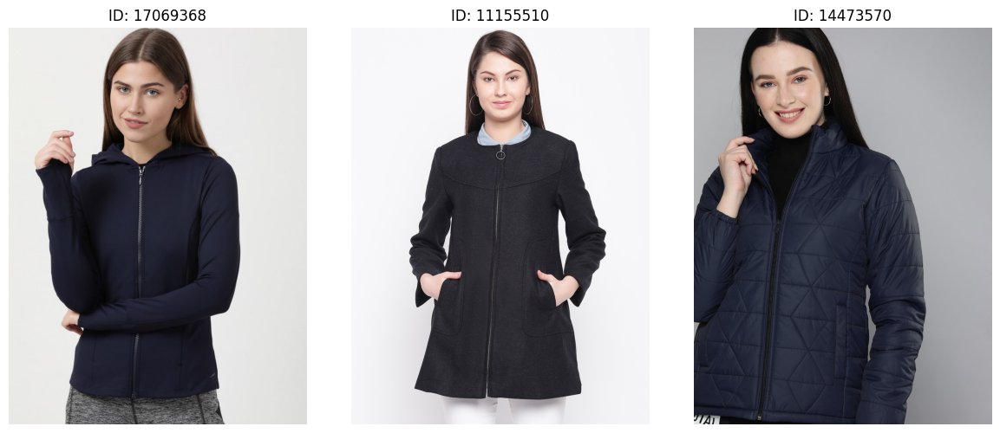



🔍 **Query:** Find denim jeans with high-rise waist and bootcut fit


🔍 Search Layer:


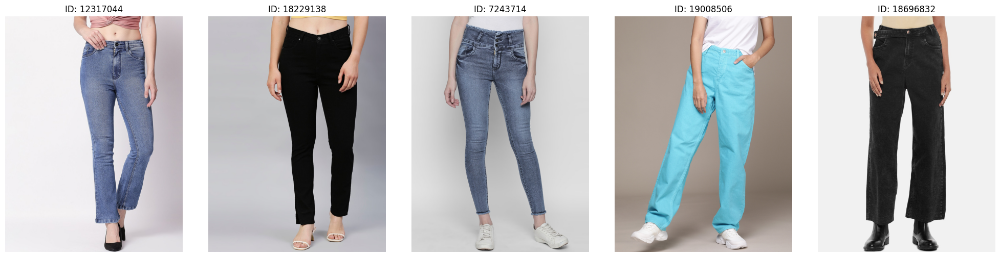

,Product Name,Product Type,Description,Score,Attributes
0,High Star Women Blue Bootcut High-Rise Clean L...,Jeans,"Blue medium wash 5-pocket high-rise jeans, cle...",4.9883,"{'Add-Ons': 'NA', 'Body or Garment Size': 'To-..."
1,High Star Women Black Slim Fit High-Rise Stret...,Jeans,"<ul> <li> Dark shade, no fade black jeans </l...",2.9452,"{'Add-Ons': 'NA', 'Body or Garment Size': 'To-..."
2,High Star Women Blue Slim Fit High-Rise Clean ...,Jeans,"Blue medium wash 5-pocket high-rise jeans, cle...",2.9175,"{'Add-Ons': 'NA', 'Body or Garment Size': 'To-..."
3,Calvin Klein Jeans Women Blue Straight Fit Hig...,Jeans,"<ul> <li> Coloured shade, no fade blue jeans ...",2.6462,"{'Add-Ons': 'NA', 'Body or Garment Size': 'To-..."
4,SF JEANS by Pantaloons Women Black Wide Leg Hi...,Jeans,"<ul> <li> Dark shade, no fade black jeans </l...",2.5627,"{'Add-Ons': 'NA', 'Body or Garment Size': 'To-..."



-------------------------------------------------------------------------------------------------------

🔍 Generation Layer:


Based on your query for denim jeans with high-rise waist and bootcut fit, here are some suitable recommendations:

1. **High Star Women Blue Bootcut High-Rise Clean Look Stretchable Jeans**
   - This pair of jeans meets your criteria with its high-rise waist and bootcut fit. It features a clean look, heavy fade, and is made of a stretchable fabric blend for comfort and style.

2. **High Star Women Black Slim Fit High-Rise Stretchable Jeans**
   - Although not bootcut, these jeans offer a slim fit with a high-rise waist, making them a flattering option. They also feature a clean look, stretchable fabric, and a dark shade ideal for versatile styling.

3. **Calvin Klein Jeans Women Blue Straight Fit High-Rise Stretchable Jeans**
   - While not bootcut, these jeans are a great option for those looking for a high-rise waist and a straight fit. The stretchable fabric and clean look add to their comfort and style.

These options provide a variety of fits and styles that align with your preferences for high-rise waist jeans with a bootcut fit.

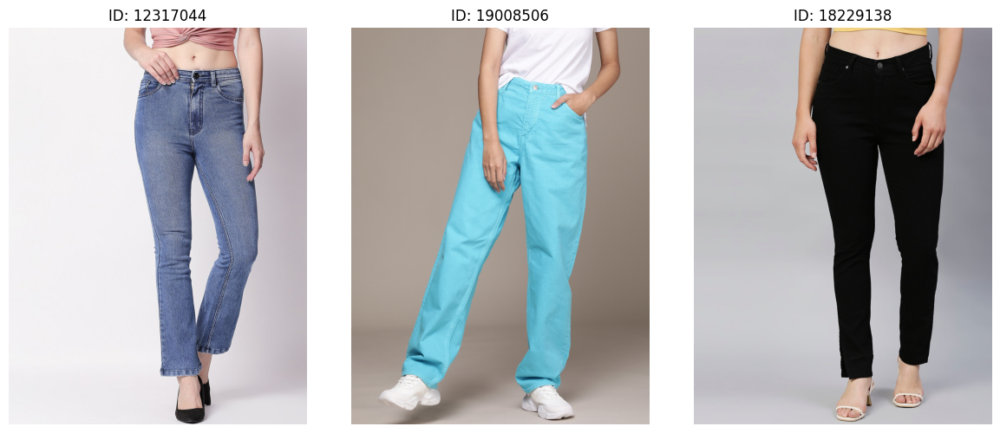

In [82]:
# 📷 6. Run all Queries & Capture Screenshots (manually or programmatically)
from IPython.display import display, Markdown, Image
import os

images_folder_path = '/content/myntra_dataset/images'

def sanitize(text):
    if isinstance(text, str):
        return text.replace('\ufeff', '').encode('ascii', 'ignore').decode('ascii')
    return str(text)

# test_queries = [
#     "I want a summer dress for beach under 1000",
#     "Show me casual shoes for men",
#     "Looking for ethnic wear for Diwali"
# ]

test_queries = [
    "Looking for a floral kurta set under ₹1500 for festive wear",
    "Show me summer dresses for women with cotton fabric",
    "Suggest formal shirts for office meetings",
    "Need winter jackets for women in black or navy blue",
    "Find denim jeans with high-rise waist and bootcut fit"
]

for q in test_queries:
    print(f"\n🔍 **Query:** {q}\n")
    print("\n🔍 Search Layer:")
    results = search_with_cache(q)
    reranked = rerank_results(q, results)

    top_docs = []
    ranked_pids = []
    for rank, (text, pid, score) in enumerate(reranked[:5], start=1):
        clean_text = sanitize(text)
        # print(f"🔸 {rank}. {clean_text} (Score: {score:.4f})")
        top_docs.append(clean_text)
        ranked_pids.append((pid))
    if ranked_pids:
        display_images_grid_colab(ranked_pids, images_folder_path)
        display_reranked_results_as_table(ranked_pids, top_docs, reranked, fashion_data)

    print("\n-------------------------------------------------------------------------------------------------------")
    print("\n🔍 Generation Layer:")

    # Generate and display the AI response
    try:
        response = generate_response(q, top_docs)
        display(Markdown(response))

        # ✅ Show matching images nicely
        matched_pids = []
        for name in fashion_data['name'].unique():
            if name.lower() in response.lower():
                pid_match = fashion_data[fashion_data['name'].str.lower() == name.lower()]
                if not pid_match.empty:
                    pid = str(pid_match.iloc[0]['p_id'])
                    matched_pids.append(pid)

        if matched_pids:
            display_images_grid_colab(matched_pids, images_folder_path)

    except Exception as e:
        print("⚠️ Display failed:", e)

    print("\n============================================================================================================")



## **Conclusion**

Comparing the search query results obtained from both the search layer and the generation layer, it's evident that the output from the generation layer is more detailed and easier to comprehend. While the search layer provides relevant results based on keyword matching or other predefined criteria, the generation layer leverages advanced AI models like GPT-3.5 to generate responses dynamically, incorporating context and generating detailed information tailored to the query.

The generation layer's ability to understand the query context and generate responses in natural language makes the output more informative and user-friendly. It can provide nuanced explanations, summaries, or even creative interpretations based on the input query. This results in responses that are not only relevant but also engaging and easy to read, enhancing the overall user experience.

Furthermore, the generation layer's flexibility allows it to adapt to various query formats and provide customized responses, catering to different user preferences and requirements. This versatility makes it a valuable tool for tasks requiring comprehensive understanding and communication of information.

In summary, while the search layer serves its purpose of retrieving relevant information efficiently, the generation layer significantly enhances the quality and readability of the output, making it a preferred choice for tasks where detailed and user-friendly responses are essential.